In [ ]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import numpy as np

In [ ]:
detector = cv2.CascadeClassifier()
detector.load("haarcascade_frontalface_default.xml")
#detector.load("haarcascade_upperbody.xml")

True

In [ ]:
img = cv2.imread("rubl.jpg", cv2.IMREAD_COLOR)
scale_percent = 75 # percent of original size
width = int(img.shape[1] * scale_percent / 100)
height = int(img.shape[0] * scale_percent / 100)
dim = (width, height)

# resize image
resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)

img = resized.copy()

img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [ ]:
faces = detector.detectMultiScale(img_gray, scaleFactor = 1.45, minNeighbors = 3)#, maxSize = (90,90))
print("Количество определенных лиц:", len(faces))

Количество определенных лиц: 2


In [ ]:
img_out = img.copy()
for (x, y, w, h) in faces:
  img_out = cv2.rectangle(img_out, (x, y, w, h), (0 , 255 , 0) , 1)
  cv2.putText(img_out, 'Face', (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.3,  (0 , 255 , 0), 1)

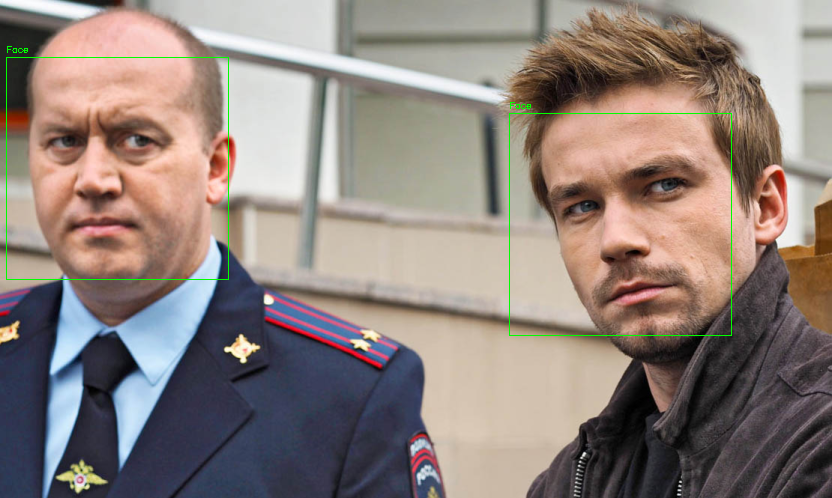

In [ ]:
cv2_imshow(img_out)

In [ ]:
# Load eyes cascade
eye_detector = cv2.CascadeClassifier()
eye_detector.load("haarcascade_eye.xml")

True

In [ ]:
# For each face use it as a ROI and detect eyes
img_out2 = img_out.copy()
all_eyes = 0
for (x, y, w, h) in faces:
  img_face = img[y:y+h, x:x+w]
  img_face_top = img[y:y+h*2//3, x:x+w]
  eyes = eye_detector.detectMultiScale(img_face_top, scaleFactor = 1.2)
  all_eyes += len(eyes)
  print(len(eyes))
  for (x2, y2, w2, h2) in eyes:
    img_out2 = cv2.rectangle(img_out2, (x+x2, y+y2, w2, h2), color = (147, 20, 255))
    cv2.putText(img_out2, 'Eye', (x+x2, y+y2-5), cv2.FONT_HERSHEY_SIMPLEX, 0.3,  (147, 20, 255), 1)

2
2


In [ ]:
# Load smile cascade
smile_detector = cv2.CascadeClassifier()
smile_detector.load("haarcascade_smile.xml")

True

In [ ]:
all_smiles = 0
for (x, y, w, h) in faces:
  img_face_bot = img[y+h*3//5:y+h, x:x+w] #нижняя 1/3 лица
  smile = smile_detector.detectMultiScale(img_face_bot, scaleFactor = 1.2)
  all_smiles += len(smile)
  print(len(smile))
  for (x2, y2, w2, h2) in smile:
    img_out3 = cv2.rectangle(img_out2, (x+x2, y+y2+h*3//5, w2, h2), color = (0, 255, 255))
    cv2.putText(img_out3, 'Smile', (x+x2, y+y2+h*3//5-5), cv2.FONT_HERSHEY_SIMPLEX, 0.3,  (0, 255, 255), 1)

1
1


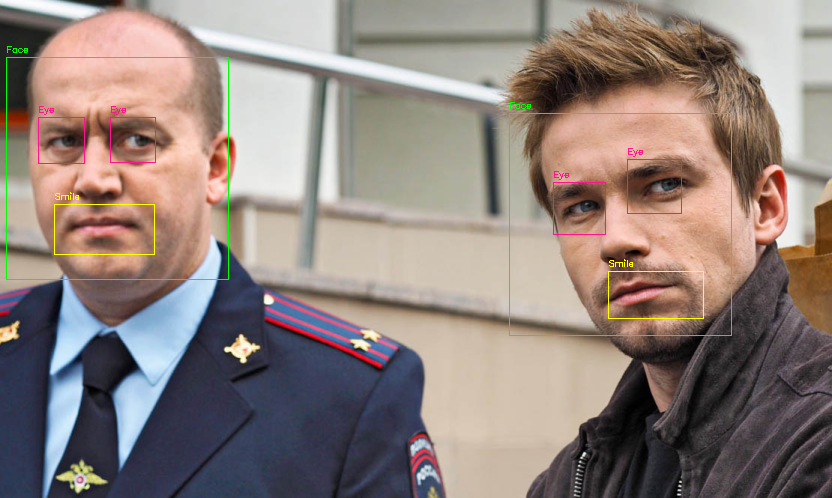

In [ ]:
cv2_imshow(img_out3)

In [ ]:
print("Количество определенных")
print("Лиц:", len(faces))
print("Глаз:", all_eyes)
print("Улыбок:", all_smiles)

Количество определенных
Лиц: 2
Глаз: 4
Улыбок: 2


# Video

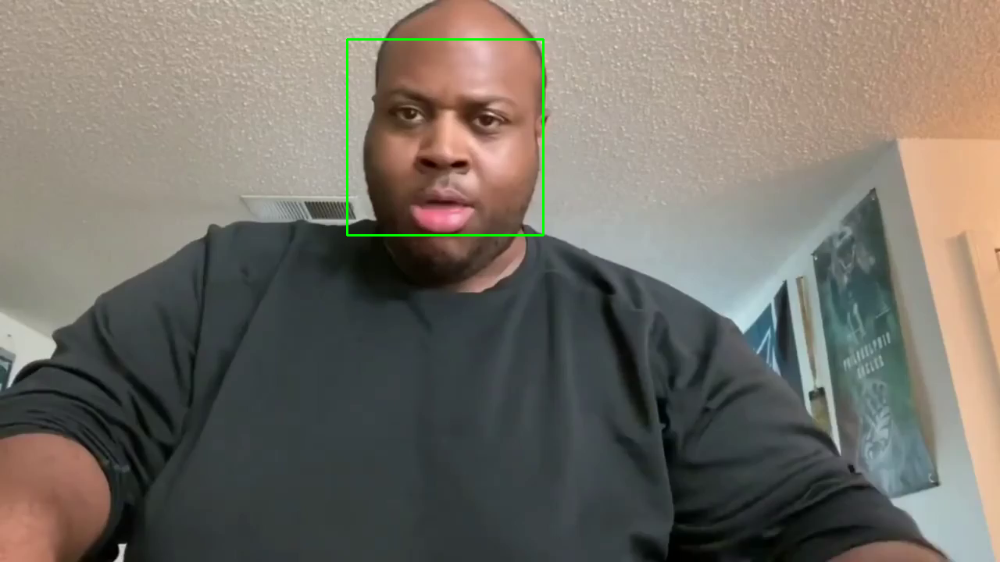

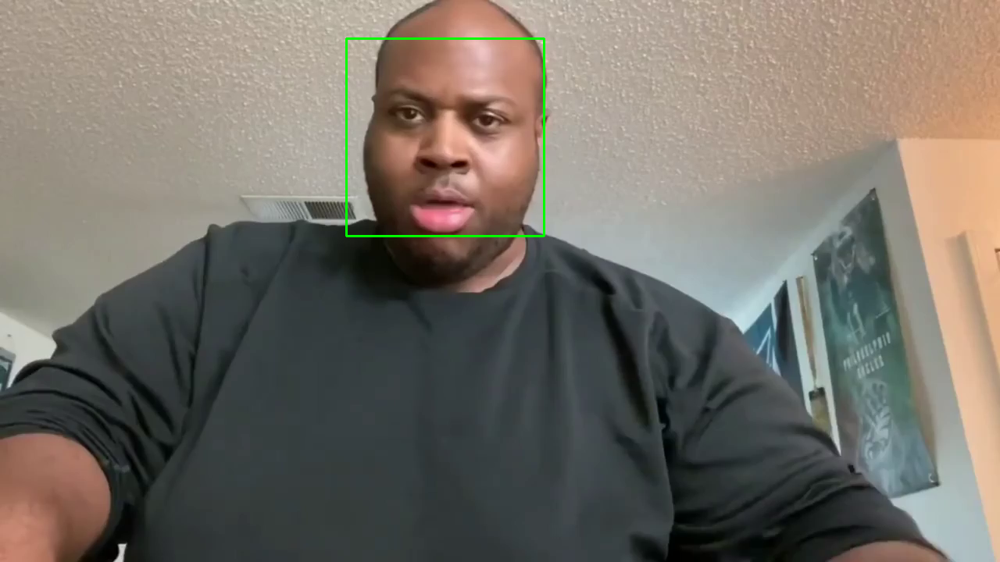

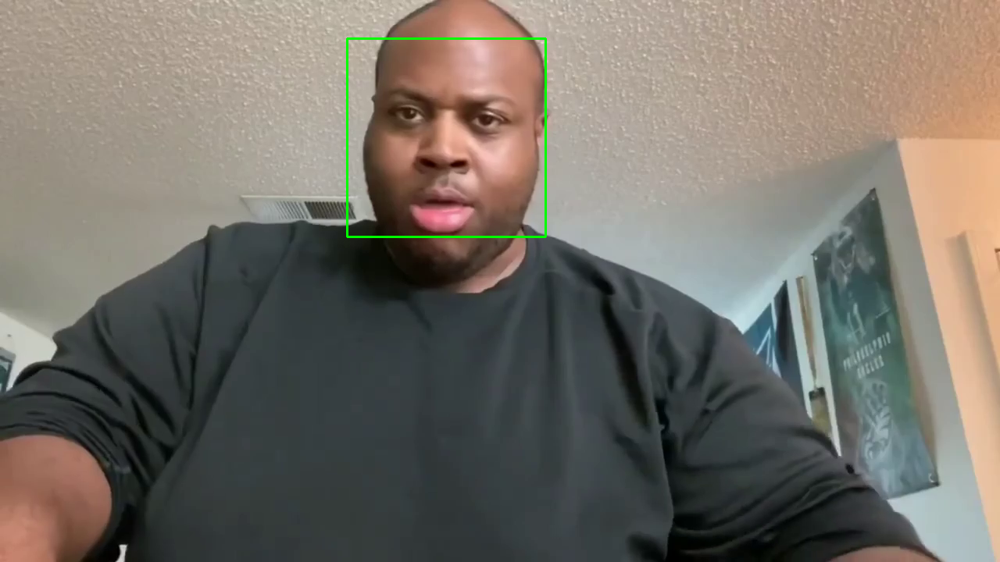

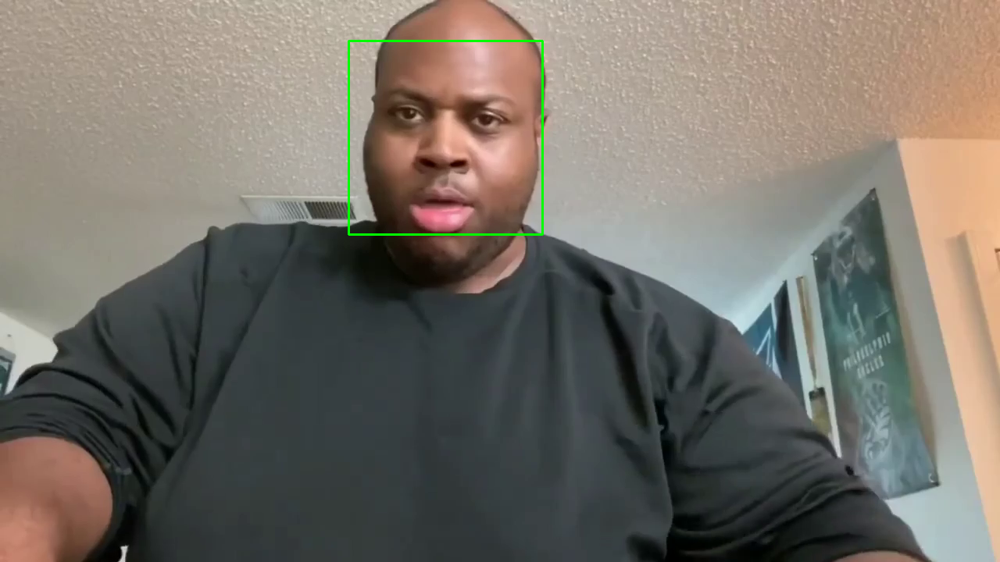

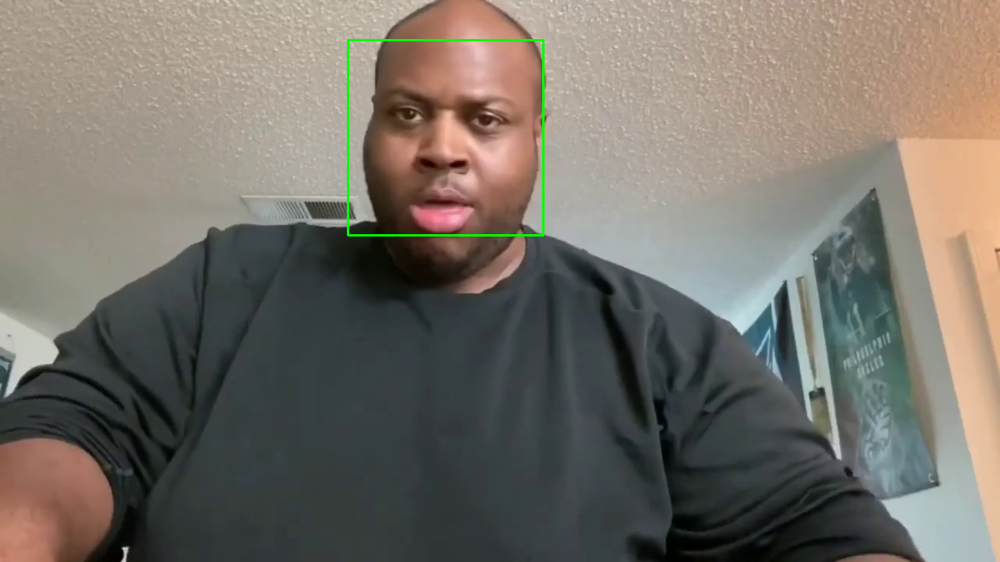

...

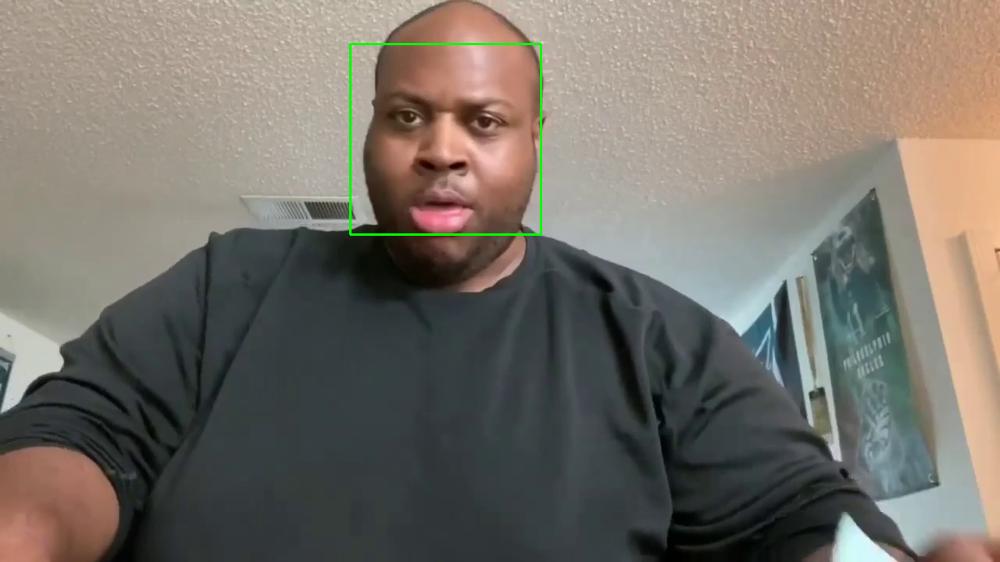

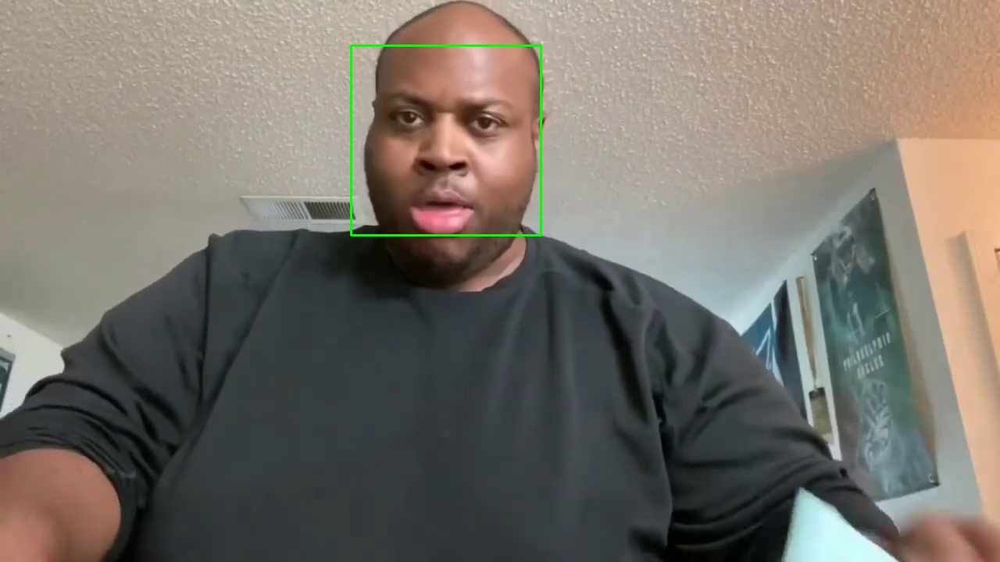

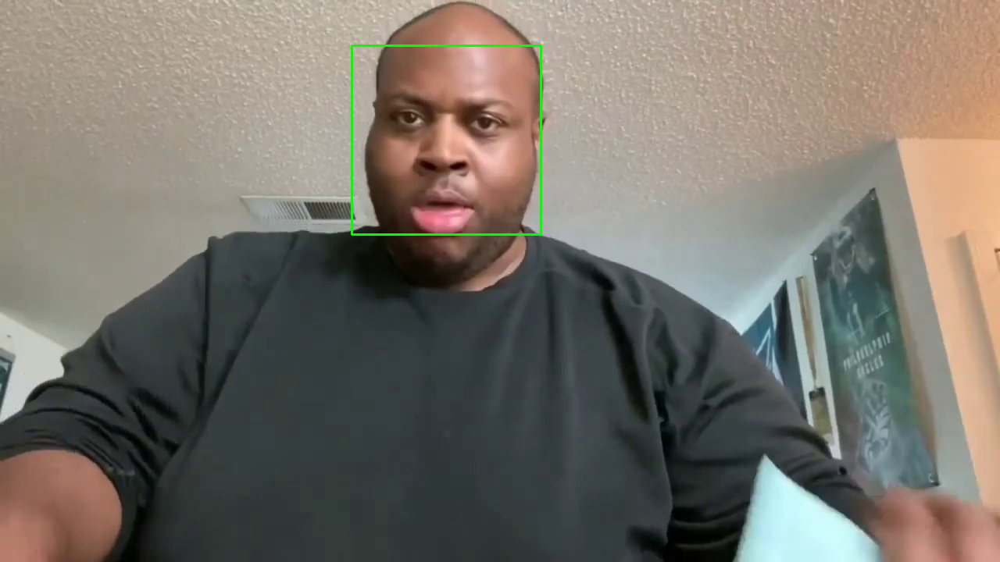

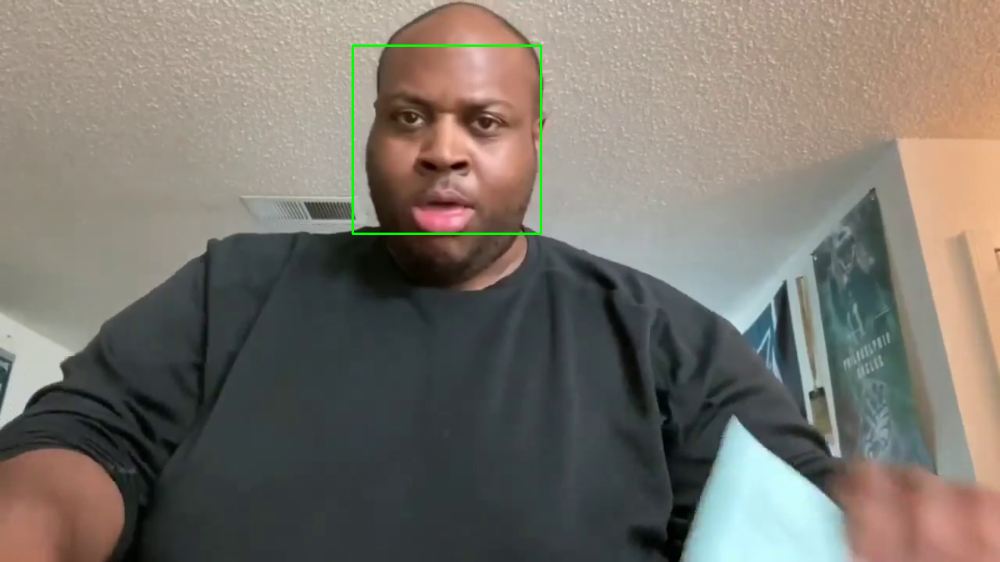

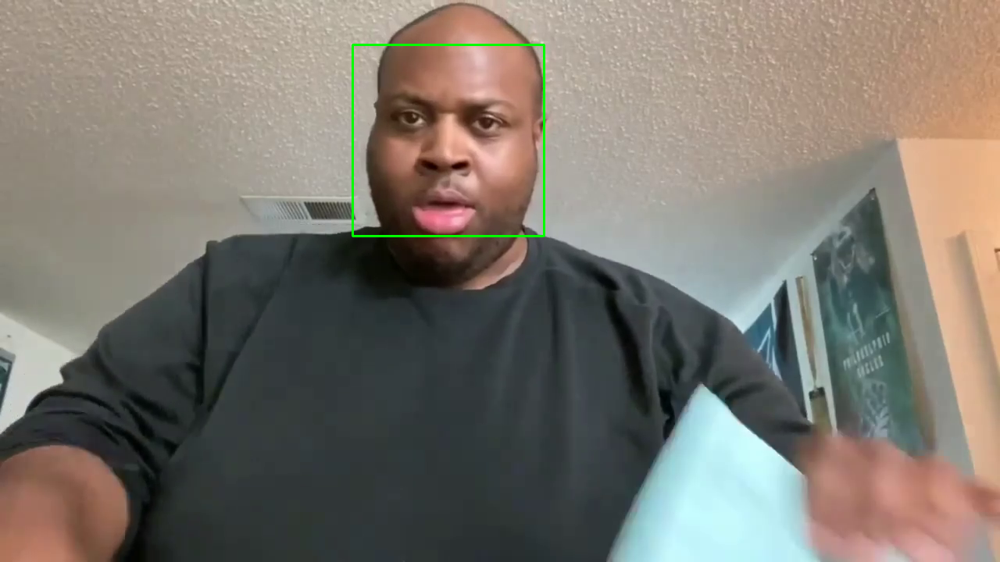

KeyboardInterrupt: ignored

In [ ]:
import cv2
scale_factor = 1.2
min_neighbors = 3
#min_size = (50, 50)
webcam=False #if working with video file then make it 'False'
def detect(path):
    cascade = cv2.CascadeClassifier(path)
    if webcam:
        video_cap = cv2.VideoCapture(1) # use 0,1,2..depanding on your webcam
    else:
        video_cap = cv2.VideoCapture("EDP Whats This.mp4")
    while True:
        # Capture frame-by-frame
        ret, img = video_cap.read()
        #converting to gray image for faster video processing
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        rects = cascade.detectMultiScale(gray, scaleFactor=scale_factor, minNeighbors=min_neighbors,
                                         minSize=None)
        # if at least 1 face detected
        if len(rects) >= 0:
            # Draw a rectangle around the faces
            for (x, y, w, h) in rects:
                cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
            # Display the resulting frame
            cv2_imshow(img)
            #wait for 'c' to close the application
            if cv2.waitKey(1) & 0xFF == ord('c'):
                break
    video_cap.release()
def main():
    cascadeFilePath="haarcascade_frontalface_default.xml"
    detect(cascadeFilePath)
    cv2.destroyAllWindows()
if __name__ == "__main__":
    main()